In [70]:
# !pip install plotly

In [71]:
# !pip install cufflinks

In [72]:
# !jupyter labextension install jupyterlab-plotly

In [1]:
# Libraries
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import plotly
import cufflinks as cf
cf.go_offline()  #make plots offline
import plotly.offline as pyo
import plotly.graph_objs as go
pyo.init_notebook_mode()
%matplotlib inline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler

# math and statistics
from scipy import stats
from scipy.stats import skew, norm
from scipy.special import boxcox1p
from scipy.stats import boxcox_normmax

import plotly.express as px


# ignore warnings
import warnings
warnings.filterwarnings(action="ignore")

In [2]:
# read the data
data = pd.read_csv('/home/ada/10academy/training/week6/data//bank-additional-full.csv', sep = ';')
data.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [3]:
# dataset overview
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
age               41188 non-null int64
job               41188 non-null object
marital           41188 non-null object
education         41188 non-null object
default           41188 non-null object
housing           41188 non-null object
loan              41188 non-null object
contact           41188 non-null object
month             41188 non-null object
day_of_week       41188 non-null object
duration          41188 non-null int64
campaign          41188 non-null int64
pdays             41188 non-null int64
previous          41188 non-null int64
poutcome          41188 non-null object
emp.var.rate      41188 non-null float64
cons.price.idx    41188 non-null float64
cons.conf.idx     41188 non-null float64
euribor3m         41188 non-null float64
nr.employed       41188 non-null float64
y                 41188 non-null object
dtypes: float64(5), int64(5), object(11)
memory usa

In [4]:
# non graphical analysis
data.describe(include = 'all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
age,41188,NaN,NaN,NaN,40.0241,10.4212,17,32,38,47,98
job,41188,12,admin.,10422,NaN,NaN,NaN,NaN,NaN,NaN,NaN
marital,41188,4,married,24928,NaN,NaN,NaN,NaN,NaN,NaN,NaN
education,41188,8,university.degree,12168,NaN,NaN,NaN,NaN,NaN,NaN,NaN
default,41188,3,no,32588,NaN,NaN,NaN,NaN,NaN,NaN,NaN
housing,41188,3,yes,21576,NaN,NaN,NaN,NaN,NaN,NaN,NaN
loan,41188,3,no,33950,NaN,NaN,NaN,NaN,NaN,NaN,NaN
contact,41188,2,cellular,26144,NaN,NaN,NaN,NaN,NaN,NaN,NaN
month,41188,10,may,13769,NaN,NaN,NaN,NaN,NaN,NaN,NaN
day_of_week,41188,5,thu,8623,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [15]:
 !jupyter labextension list 

JupyterLab v1.1.4
Known labextensions:
   app dir: /home/ada/anaconda3/share/jupyter/lab
        jupyterlab-plotly v4.9.0  enabled  OK


In [16]:
!jupyter lab build

[LabBuildApp] JupyterLab 1.1.4
[LabBuildApp] Building in /home/ada/anaconda3/share/jupyter/lab
[LabBuildApp] Building jupyterlab assets (build:prod:minimize)


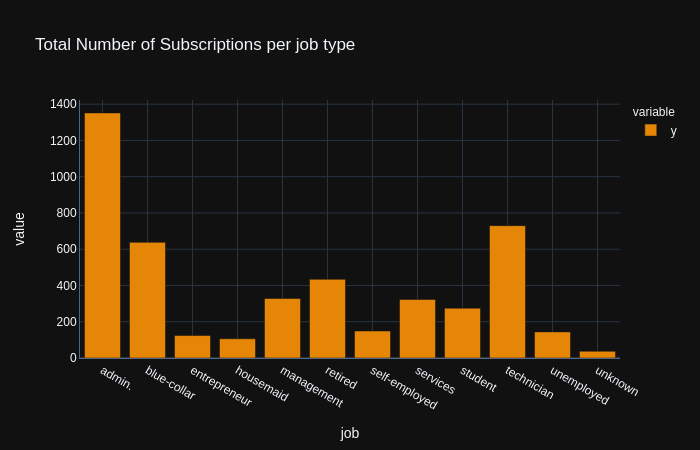

In [5]:
# job
df = data[['job', 'y']]
df["y"].loc[df["y"] == 'no'] = 0
df["y"].loc[df["y"] == 'yes'] = 1
df = df.groupby('job').sum()
df = df.reset_index()
fig = px.bar(df, x = 'job', y = ['y'],  color_discrete_sequence=px.colors.qualitative.Vivid, template = 'plotly_dark', title = 'Total Number of Subscriptions per job type' )
fig.show(renderer="png")
# df.iplot(kind = 'bar', x = 'job', y = ['y'], theme = 'space', title = 'Total Number of Subscriptions per job type' )

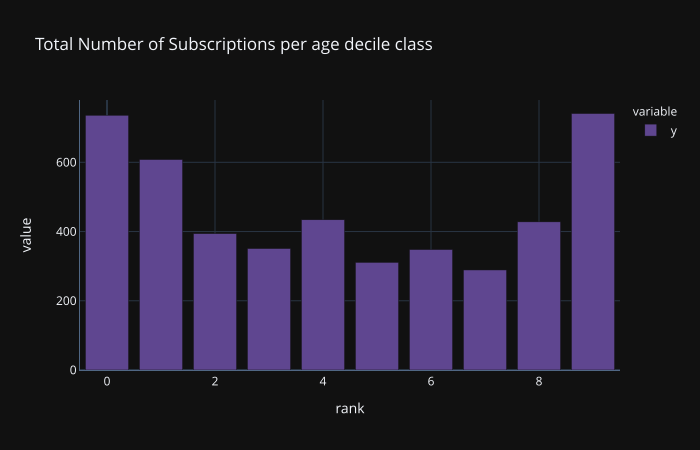

In [6]:
# age 
# creating age deciles
data['rank'] = pd.qcut(data['age'], 10, labels = False) 
new_df = data[['rank', 'y']]
new_df["y"].loc[new_df["y"] == 'no'] = 0
new_df["y"].loc[new_df["y"] == 'yes'] = 1
a = new_df.groupby('rank').sum()  # get total subscriptons per decile class
a = a.reset_index()
# a.iplot(kind = 'bar', x = 'rank', y = ['y'], theme = 'henanigans', title = 'Total Number of Subscriptions per age decile class' )
fig = px.bar(a, x = 'rank', y = ['y'],  color_discrete_sequence=px.colors.qualitative.Prism, template = 'plotly_dark', title = 'Total Number of Subscriptions per age decile class' )
fig.show(renderer="svg")

In [7]:
cf.getThemes()

['ggplot', 'pearl', 'solar', 'space', 'white', 'polar', 'henanigans']

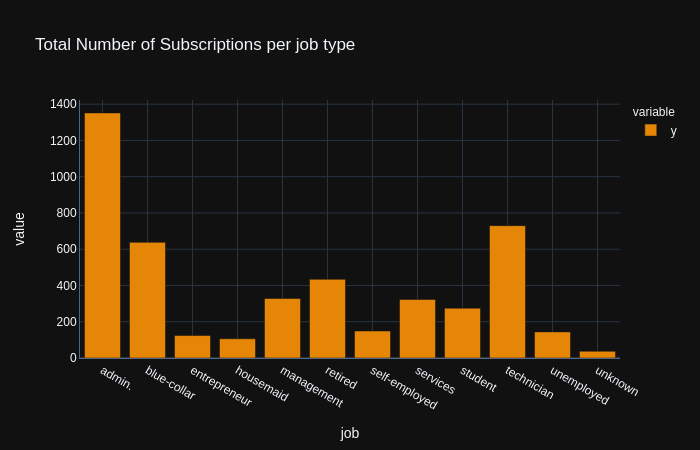

In [8]:
# job
df = data[['job', 'y']]
df["y"].loc[df["y"] == 'no'] = 0
df["y"].loc[df["y"] == 'yes'] = 1
df = df.groupby('job').sum()
df = df.reset_index()
fig = px.bar(df, x = 'job', y = ['y'],  color_discrete_sequence=px.colors.qualitative.Vivid, template = 'plotly_dark', title = 'Total Number of Subscriptions per job type' )
fig.show(renderer="png")
# df.iplot(kind = 'bar', x = 'job', y = ['y'], theme = 'space', title = 'Total Number of Subscriptions per job type' )

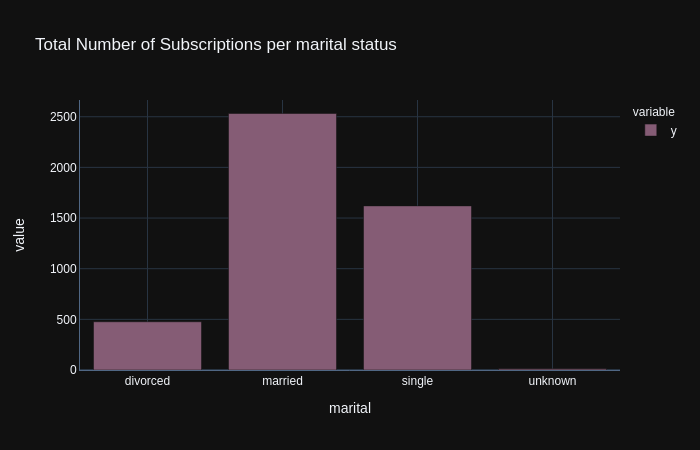

In [9]:
# marital status
df = data[['marital', 'y']]
df["y"].loc[df["y"] == 'no'] = 0
df["y"].loc[df["y"] == 'yes'] = 1
df = df.groupby('marital').sum()
df = df.reset_index()
# df.iplot(kind = 'bar', x = 'marital', y = ['y'], theme = 'space', title = 'Total Number of Subscriptions per marital status' )
fig = px.bar(df, x = 'marital', y = ['y'],  color_discrete_sequence=px.colors.qualitative.Antique, template = 'plotly_dark', title = 'Total Number of Subscriptions per marital status' )
fig.show(renderer="png")

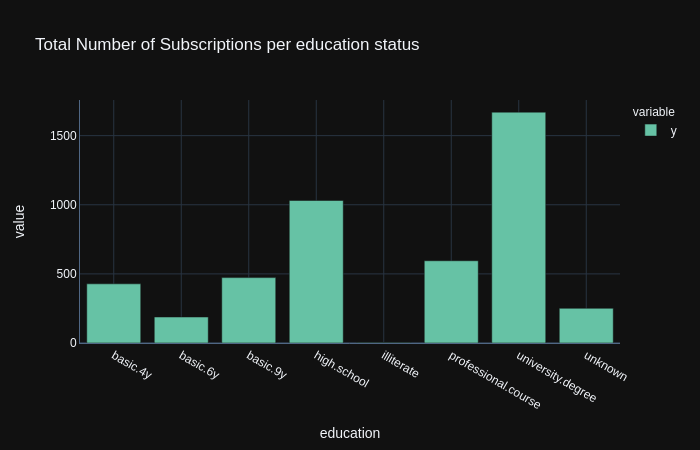

In [10]:
# education
df = data[['education', 'y']]
df["y"].loc[df["y"] == 'no'] = 0
df["y"].loc[df["y"] == 'yes'] = 1
df = df.groupby('education').sum()
df = df.reset_index()
fig = px.bar(df, x = 'education', y = ['y'], color_discrete_sequence=px.colors.qualitative.Set2,  template = 'plotly_dark', title = 'Total Number of Subscriptions per education status' )
fig.show(renderer="png")

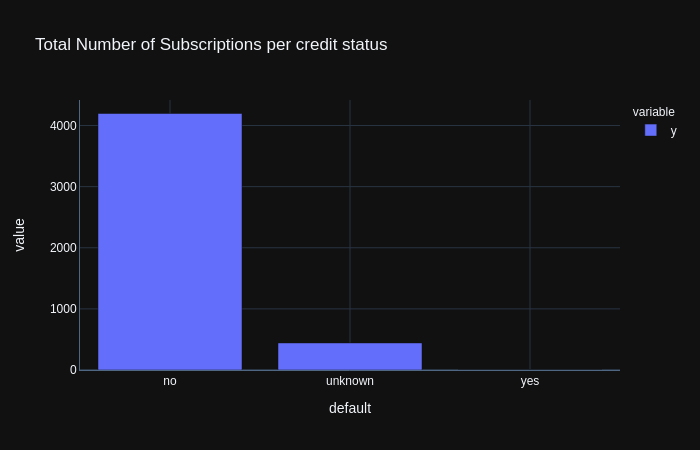

In [11]:
# default
df = data[['default', 'y']]
df["y"].loc[df["y"] == 'no'] = 0
df["y"].loc[df["y"] == 'yes'] = 1
df = df.groupby('default').sum()
df = df.reset_index()
fig = px.bar(df, x = 'default', y = ['y'], template = 'plotly_dark', title = 'Total Number of Subscriptions per credit status' )
fig.show(renderer="png")

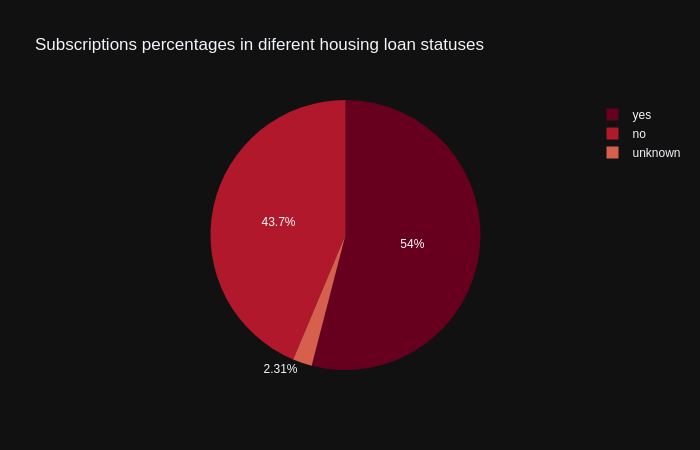

In [12]:
# housing
df = data[['housing', 'y']]
df["y"].loc[df["y"] == 'no'] = 0
df["y"].loc[df["y"] == 'yes'] = 1
df = df.groupby('housing').sum()
df = df.reset_index()
fig = px.pie(df, values='y', names='housing', title='Subscriptions percentages in diferent housing loan statuses', template = 'plotly_dark', color_discrete_sequence=px.colors.sequential.RdBu)
fig.update_layout(
    autosize=False,
    width=600,
    height=600,)
fig.show(renderer="png")

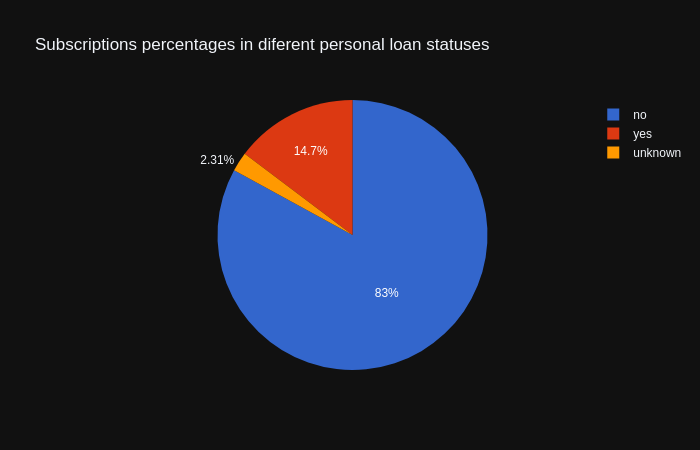

In [13]:
# loan
df = data[['loan', 'y']]
df["y"].loc[df["y"] == 'no'] = 0
df["y"].loc[df["y"] == 'yes'] = 1
df = df.groupby('loan').sum()
df = df.reset_index()
fig = px.pie(df, values='y', names='loan', template = 'plotly_dark', title='Subscriptions percentages in diferent personal loan statuses', color_discrete_sequence=px.colors.qualitative.G10)
fig.update_layout(
    autosize=False,
    width=600,
    height=600,)
fig.show(renderer="png")

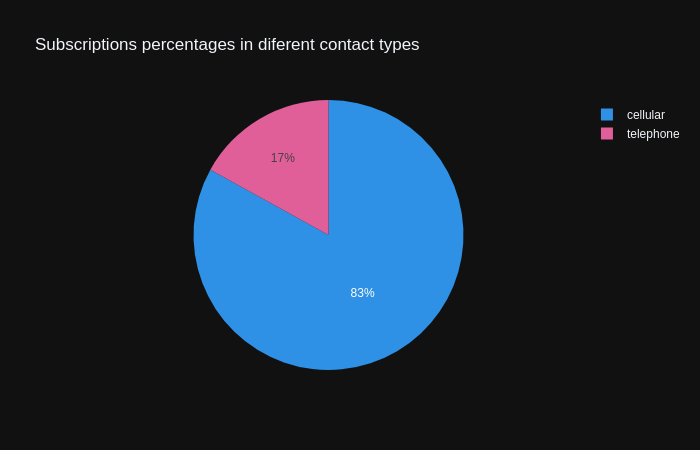

In [14]:
# contact
df = data[['contact', 'y']]
df["y"].loc[df["y"] == 'no'] = 0
df["y"].loc[df["y"] == 'yes'] = 1
df = df.groupby('contact').sum()
df = df.reset_index()
fig = px.pie(df, values='y', names='contact', title='Subscriptions percentages in diferent contact types', template = 'plotly_dark', color_discrete_sequence=px.colors.qualitative.Dark24)
fig.update_layout(
    autosize=False,
    width=600,
    height=600,)
fig.show(renderer="png")

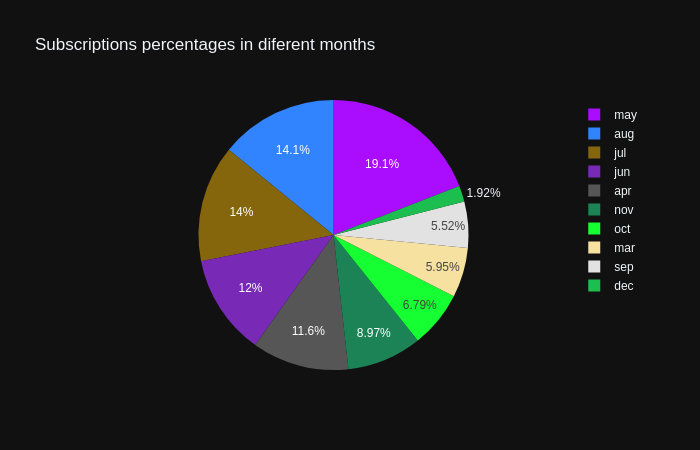

In [15]:
# month
df = data[['month', 'y']]
df["y"].loc[df["y"] == 'no'] = 0
df["y"].loc[df["y"] == 'yes'] = 1
df = df.groupby('month').sum()
df = df.reset_index()
fig = px.pie(df, values='y', names='month', title='Subscriptions percentages in diferent months', template = 'plotly_dark', color_discrete_sequence=px.colors.qualitative.Alphabet)
fig.update_layout(
    autosize=False,
    width=600,
    height=600,)
fig.show(renderer="png")

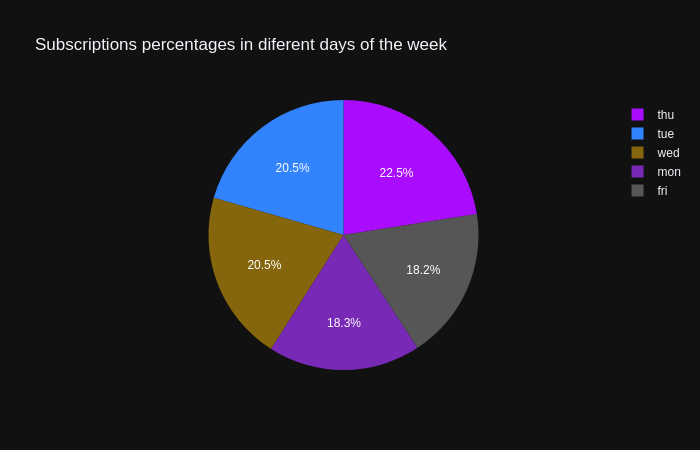

In [16]:
# day_of_week
df = data[['day_of_week', 'y']]
df["y"].loc[df["y"] == 'no'] = 0
df["y"].loc[df["y"] == 'yes'] = 1
df = df.groupby('day_of_week').sum()
df = df.reset_index()
fig = px.pie(df, values='y', names='day_of_week', title='Subscriptions percentages in diferent days of the week', template = 'plotly_dark', color_discrete_sequence=px.colors.qualitative.Alphabet)
fig.update_layout(
    autosize=False,
    width=600,
    height=600,)
fig.show(renderer="png")

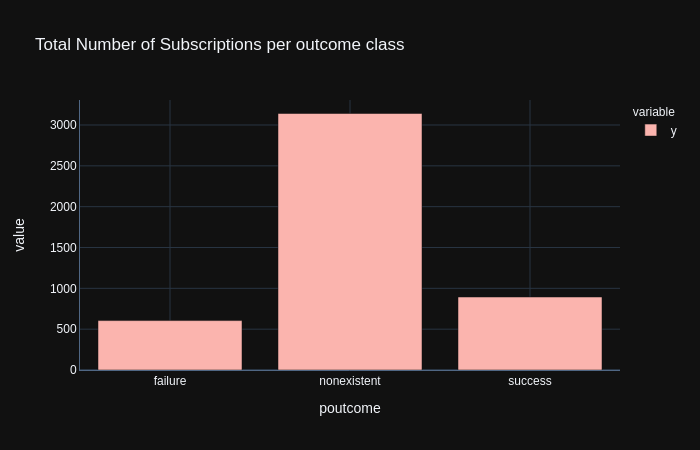

In [17]:
# poutcome
df = data[['poutcome', 'y']]
df["y"].loc[df["y"] == 'no'] = 0
df["y"].loc[df["y"] == 'yes'] = 1
df = df.groupby('poutcome').sum()
df = df.reset_index()
# df.iplot(kind = 'bar', x = 'marital', y = ['y'], theme = 'space', title = 'Total Number of Subscriptions per marital status' )
fig = px.bar(df, x = 'poutcome', y = ['y'], color_discrete_sequence=px.colors.qualitative.Pastel1, template = 'plotly_dark', title = 'Total Number of Subscriptions per outcome class' )
fig.show(renderer="png")

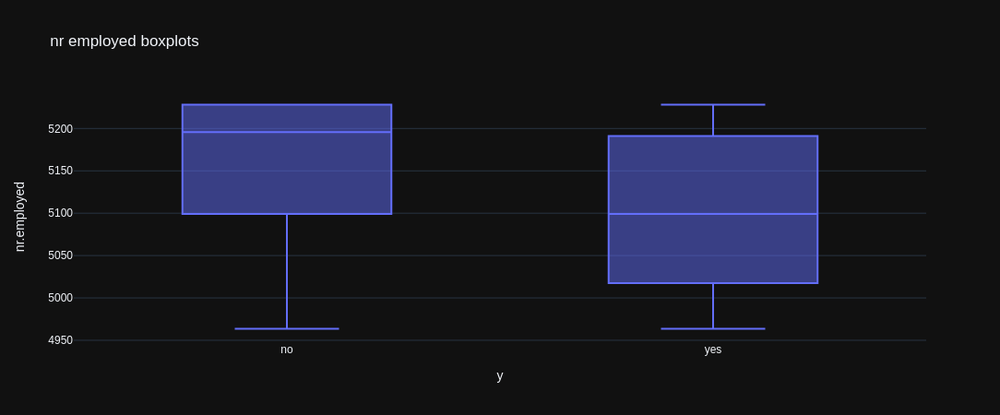

In [61]:
# nr.employed
fig = px.box(data,x = 'y',  y="nr.employed", template = 'plotly_dark',
            title = 'nr employed boxplots')
fig.show()

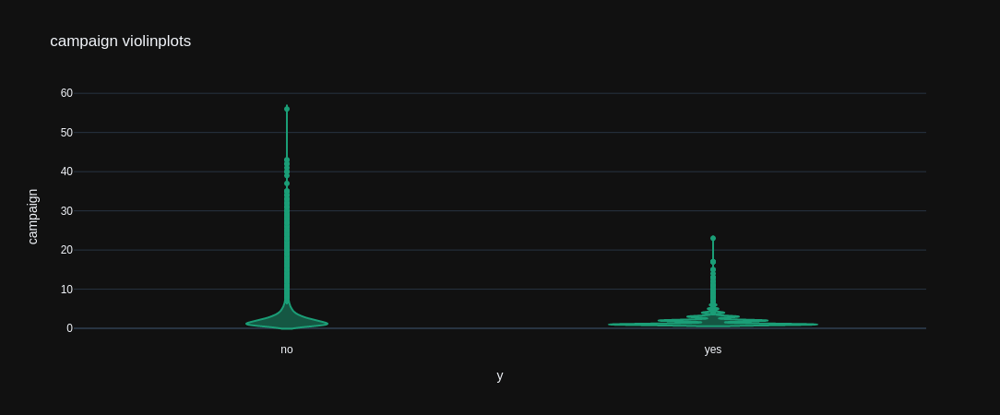

In [63]:
# campaign
fig = px.violin(data,x = 'y',  y="campaign", template = 'plotly_dark',
            color_discrete_sequence=px.colors.qualitative.Dark2,
               title = 'campaign violinplots')
fig.show()

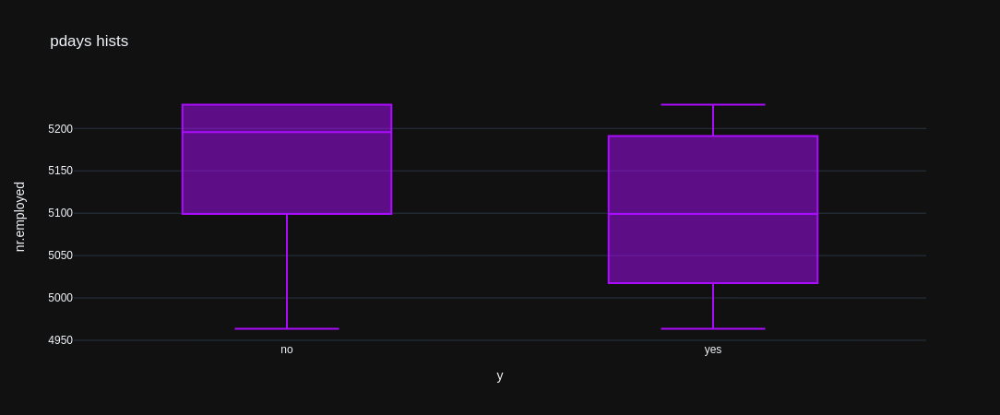

In [64]:
# pdays
fig = px.box(data,x = 'y',  y="nr.employed", template = 'plotly_dark',
            color_discrete_sequence=px.colors.qualitative.Alphabet,
            title = 'pdays hists')
fig.show()

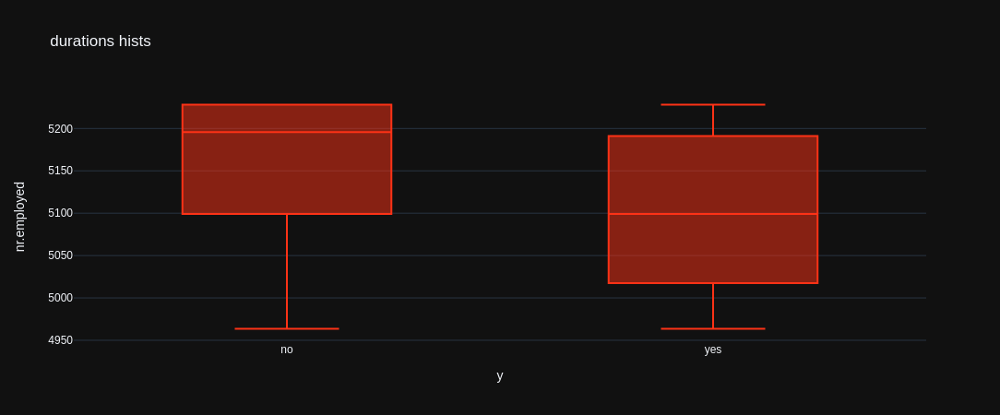

In [65]:
# duration
fig = px.box(data,x = 'y',  y="nr.employed", template = 'plotly_dark',
            color_discrete_sequence=px.colors.qualitative.Light24,
            title = 'durations hists')
fig.show()

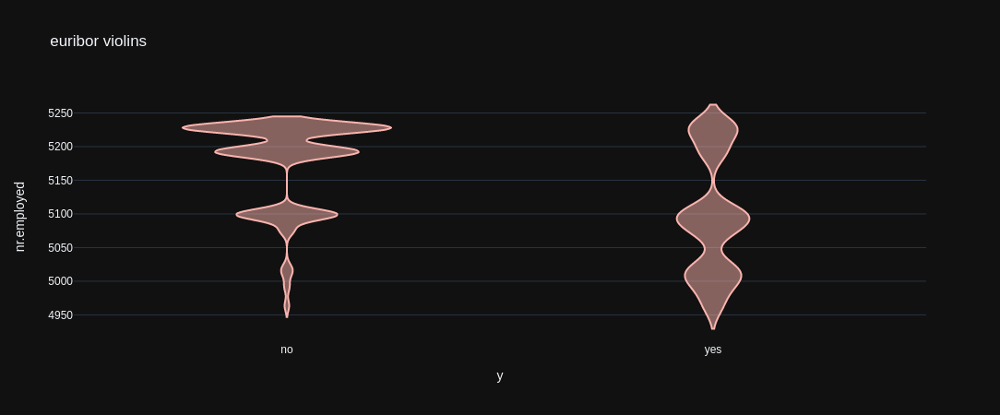

In [66]:
# euribor3m
fig = px.violin(data,x = 'y',  y="nr.employed", template = 'plotly_dark',
            color_discrete_sequence=px.colors.qualitative.Pastel1,
               title = 'euribor violins')
fig.show()

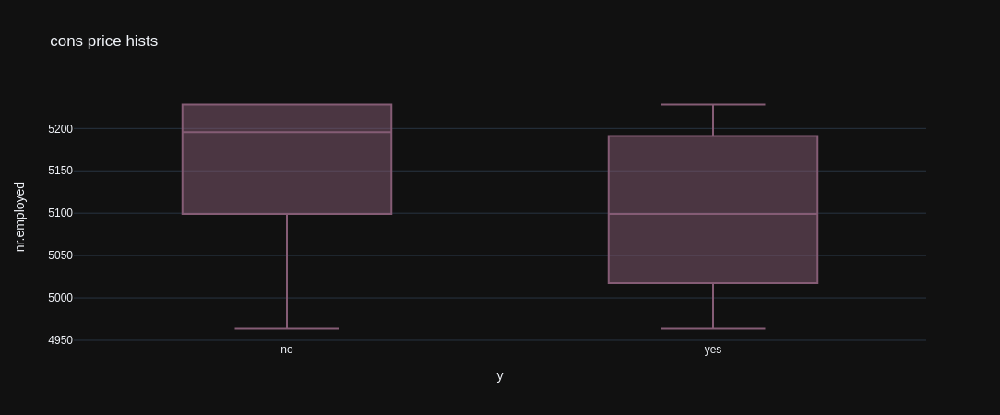

In [69]:
# cons.price.idx
fig = px.box(data,x = 'y',  y="nr.employed", template = 'plotly_dark',
            color_discrete_sequence=px.colors.qualitative.Antique,
            title = 'cons price hists')
fig.show()

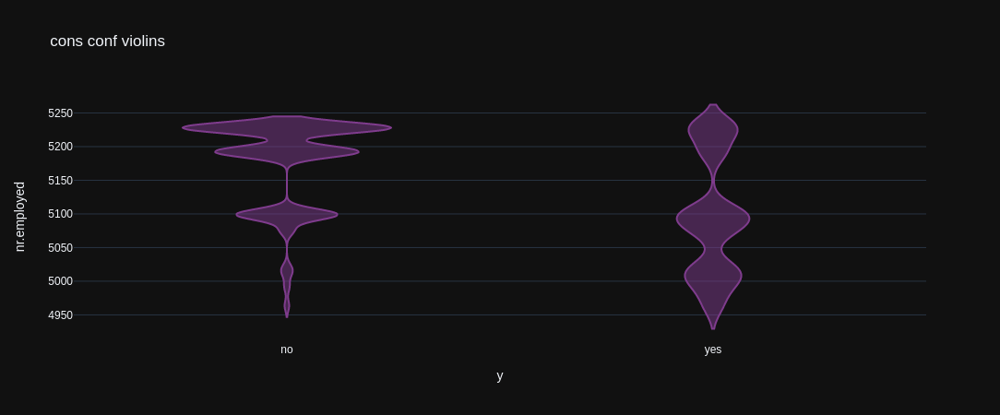

In [68]:
# cons.conf.idx
fig = px.violin(data,x = 'y',  y="nr.employed", template = 'plotly_dark', 
            color_discrete_sequence=px.colors.qualitative.Bold,
               title = 'cons conf violins')
fig.show()

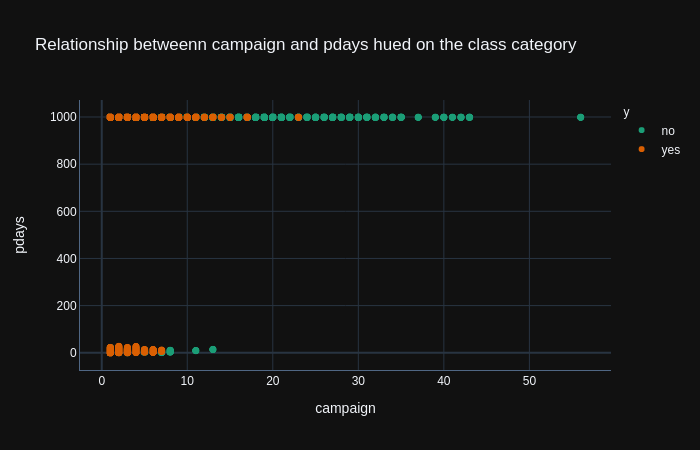

In [34]:
# campaign + pdays
fig = px.scatter(data, x="campaign", y="pdays", color="y",
                 color_discrete_sequence=px.colors.qualitative.Dark2, 
                 template = 'plotly_dark', title = 'Relationship betweenn campaign and pdays hued on the class category')
fig.show(renderer = 'png')

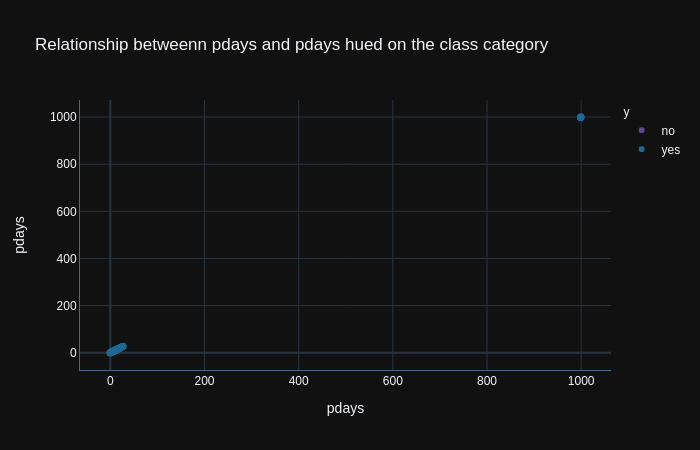

In [35]:
# pdays + duration
fig = px.scatter(data, x="pdays", y="pdays", color="y",
                 color_discrete_sequence=px.colors.qualitative.Prism, 
                 template = 'plotly_dark', title = 'Relationship betweenn pdays and pdays hued on the class category')
fig.show(renderer = 'png')

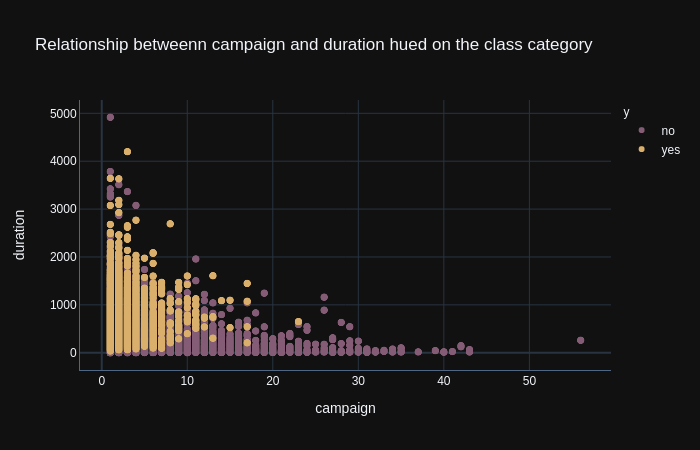

In [36]:
# campaign + duration
fig = px.scatter(data, x="campaign", y="duration", color="y",
                 color_discrete_sequence=px.colors.qualitative.Antique, 
                 template = 'plotly_dark', title = 'Relationship betweenn campaign and duration hued on the class category')
fig.show(renderer = 'png')

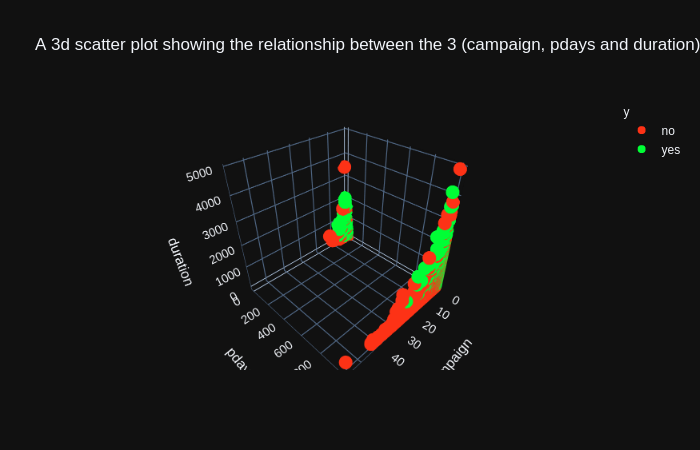

In [38]:
# 3d scatter plot of the 3
fig = px.scatter_3d(data, x = 'campaign',  
                    y = 'pdays', z = 'duration', template = 'plotly_dark', 
                    color_discrete_sequence=px.colors.qualitative.Light24, 
                    color = 'y', title = 'A 3d scatter plot showing the relationship between the 3 (campaign, pdays and duration)') 
fig = fig.update_layout(
    autosize=False,
    width=800,
    height=800,)
fig.show(renderer = 'png')

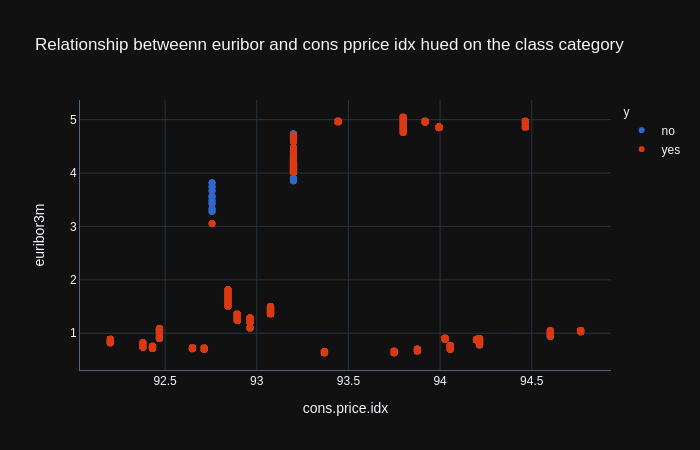

In [19]:
# cons.price.idx, euribor3m, y
fig = px.scatter(data, x="cons.price.idx", y="euribor3m", color="y", color_discrete_sequence=px.colors.qualitative.G10, template = 'plotly_dark', title = 'Relationship betweenn euribor and cons pprice idx hued on the class category')
fig.show(renderer = 'png')

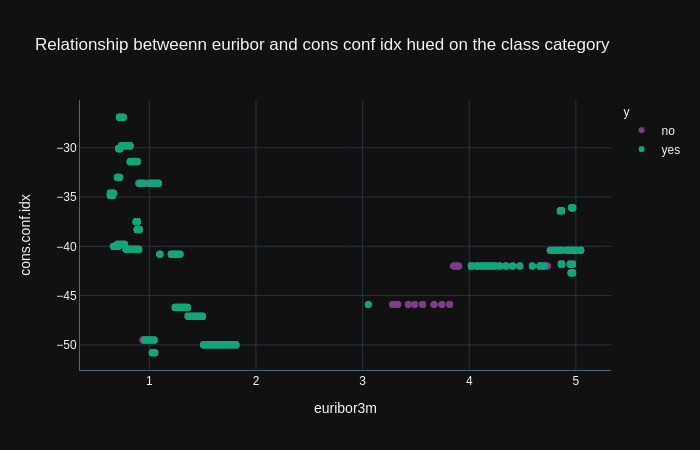

In [20]:
# euribor3m, cons.conf.idx, y
fig = px.scatter(data, x="euribor3m", y="cons.conf.idx", color="y",  color_discrete_sequence=px.colors.qualitative.Bold, template = 'plotly_dark', title = 'Relationship betweenn euribor and cons conf idx hued on the class category')
fig.show(renderer = 'png')

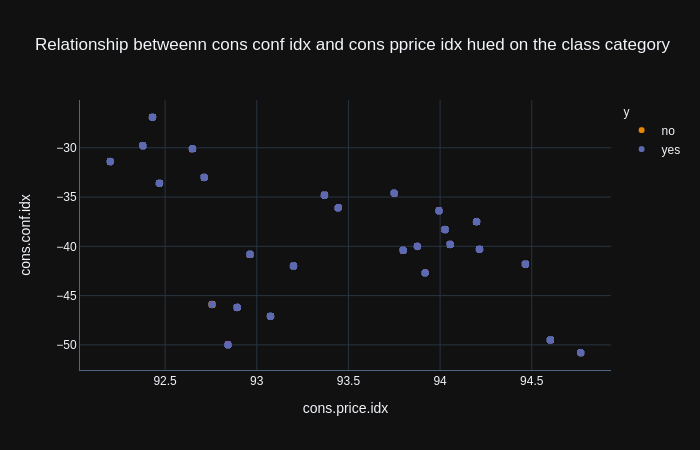

In [21]:
# cons.price.idx, cons.conf.idx, y
fig = px.scatter(data, x="cons.price.idx", y="cons.conf.idx", color="y",  color_discrete_sequence=px.colors.qualitative.Vivid, template = 'plotly_dark', title = 'Relationship betweenn cons conf idx and cons pprice idx hued on the class category')
fig.show(renderer = 'png')

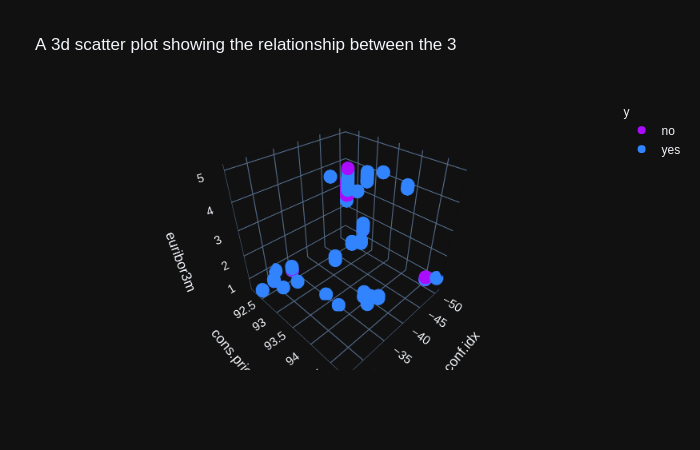

In [32]:
# 3d scatter plot of the 3
fig = px.scatter_3d(data, x = 'cons.conf.idx',  
                    y = 'cons.price.idx', z = 'euribor3m', template = 'plotly_dark', 
                    color_discrete_sequence=px.colors.qualitative.Alphabet, 
                    color = 'y', title = 'A 3d scatter plot showing the relationship between the 3') 
fig = fig.update_layout(
    autosize=False,
    width=800,
    height=800,)
fig.show(renderer = 'png')